In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"]= (10,2)
from statsmodels.tsa.stattools import adfuller
import warnings
warnings.filterwarnings("ignore")
import plotly.express as px
from sklearn.impute import KNNImputer
import sys
sys.path.append("D://NILM/code/")
from common import scatter, sliderPlot#, create_features
from main import NILM

In [2]:
lst = ["f"]
path = "d:/NILM/Data_files/Parquet/Appliances12_06_04_08/"
print("data read done")
""" data ingestion done """

""" data transformation """
complete_data_lst = [] # empty list to store final data set of all appliances
for i in range(len(lst)):
    df = pd.read_parquet(f"{path}{lst[i]}.parquet")
    df['timestamp'] = pd.to_datetime(df['timestamp'])
    df.drop_duplicates(inplace=True)  
    df.set_index(['timestamp'],inplace=True ,drop=True)
    df.drop(df[(df['frequency']>51) | (df['frequency']<49)].index, inplace=True)
    df.drop(df[(df['PF']>1) | (df['PF']<0)].index, inplace=True)
    # df.drop(df[(df['current']>20) |(df['current']<0.07)].index, inplace=True)
    df.drop(df[df['voltage']<140].index, inplace=True)
    
    # power is active power derived from voltage current and pf
    df['power'] = (df['voltage'] * df['current'] * df['PF']).round(2)
    
    if lst[i]=="f":
        df_appliance = df[['power',"voltage",'current']].resample(rule="1s").asfreq()
        df_appliance = df_appliance.rename(columns={'power': f'{lst[i]}_A', 'voltage': f'{lst[i]}_V', 'current': f'{lst[i]}_C'})
    else:
        df_sample_lst = [] # empty list for storing resampled data at 1sec frequency of each hour
        unique_dates = pd.Series(df.index.date).unique()
        for date1 in unique_dates: # dates when applince is on                             
            df_date = df[df.index.to_series().dt.date == date1] # dataframe of that perticular date
            hours = df_date.index.hour.unique() # hours when appliance is on
            for h in hours:
                date2 = f"{date1} {h:02d}"
                df_hour = df_date.loc[date2] # dataframe of that perticular hour at which appliance was on 
                df_resampled_hour = df_hour[['power',"voltage",'current']].resample(rule="1s").asfreq()
                df_sample_lst.append(df_resampled_hour) # adding each hour data in lst
        df_appliance = pd.concat(df_sample_lst) # concating all hours data into single data frame with missing values within signature
        df_appliance = df_appliance.rename(columns={'power': f'{lst[i]}_A', 'voltage': f'{lst[i]}_V', 'current': f'{lst[i]}_C'})
        # df_appliance = create_features(df_appliance)
    complete_data_lst.append(df_appliance) # all applince data in list
print("transormation done")

data read done
transormation done


In [ ]:
lst = ["f"]
path = "d:/NILM/Data_files/Parquet/Appliances12_06_04_08/"
print("data read done")
""" data ingestion done """

""" data transformation """
complete_data_lst = [] # empty list to store final data set of all appliances
for i in range(len(lst)):
    df = pd.read_parquet(f"{path}{lst[i]}.parquet")
    df['timestamp'] = pd.to_datetime(df['timestamp'])
    df.drop_duplicates(inplace=True)  
    df.set_index(['timestamp'],inplace=True ,drop=True)
    df.drop(df[(df['frequency']>51) | (df['frequency']<49)].index, inplace=True)
    df.drop(df[(df['PF']>1) | (df['PF']<0)].index, inplace=True)
    # df.drop(df[(df['current']>20) |(df['current']<0.07)].index, inplace=True)
    df.drop(df[df['voltage']<140].index, inplace=True)
    df.drop(df.last_valid_index(), axis=0, inplace=True)
    
    
    # power is active power derived from voltage current and pf
    df['power'] = (df['voltage'] * df['current'] * df['PF']).round(2)
    
    if lst[i]=="fsd":
        df_appliance = df[['power',"voltage",'current']].resample(rule="1s").asfreq()
        df_appliance = df_appliance.rename(columns={'power': f'{lst[i]}_A', 'voltage': f'{lst[i]}_V', 'current': f'{lst[i]}_C'})
    else:
        df_sample_lst = [] # empty list for storing resampled data at 1sec frequency of each hour
        unique_dates = pd.Series(df.index.date).unique()
        for date1 in unique_dates: # dates when applince is on                             
            df_date = df[df.index.to_series().dt.date == date1] # dataframe of that perticular date
            hours = df_date.index.hour.unique() # hours when appliance is on
            for h in hours:
                date2 = f"{date1} {h:02d}"
                df_hour = df_date.loc[date2] # dataframe of that perticular hour at which appliance was on 
                df_resampled_hour = df_hour[['power',"voltage",'current']].resample(rule="1s").asfreq()
                df_sample_lst.append(df_resampled_hour) # adding each hour data in lst
        df_appliance = pd.concat(df_sample_lst) # concating all hours data into single data frame with missing values within signature
        df_appliance = df_appliance.rename(columns={'power': f'{lst[i]}_A', 'voltage': f'{lst[i]}_V', 'current': f'{lst[i]}_C'})
        # df_appliance = create_features(df_appliance)
    complete_data_lst.append(df_appliance) # all applince data in list
print("transormation done")

In [3]:
df = complete_data_lst[0]
df

,f_A,f_V,f_C
timestamp,,,
2013-06-12 00:00:00,127.53,240.02,0.595
2013-06-12 00:00:01,127.01,240.11,0.593
2013-06-12 00:00:02,126.81,240.14,0.592
2013-06-12 00:00:03,126.22,240.10,0.590
2013-06-12 00:00:04,125.85,240.07,0.589
...,...,...,...
2013-08-03 23:59:55,79.92,235.84,0.422
2013-08-03 23:59:56,79.93,235.81,0.420
2013-08-03 23:59:57,80.09,235.77,0.422


In [4]:
print(len(df))
df.isna().sum()

4579200


f_A    535216
f_V    535216
f_C    535216
dtype: int64

In [ ]:
if not isinstance(df.index, pd.DatetimeIndex):
    df.index = pd.to_datetime(df.index)

# List of specific dates you want to retrieve data from
specific_dates = ['2013-06-15', '2013-06-17', '2013-06-23', '2013-06-25', '2013-06-28', '2013-06-29', '2013-06-30']
mask = df.index.date.isin(pd.to_datetime(specific_dates).date)

# Use the mask to filter the DataFrame
df1 = df[mask]


In [ ]:
df1

In [ ]:
df1.isna().sum()

In [ ]:
unique_dates = pd.Series(df1.index.date).unique()
l1 = []
for date1 in unique_dates:
    # print(date1)
    df_date = df1[df1.index.to_series().dt.date == date1]    
    # l1.append(date1)
    # hours = df_date.index.hour.unique()
    if df_date['f_A'].count()>77000:
        if df_date['f_A'].count()==79384:
            continue
        print(date1,df_date['f_A'].count())
        # df_date['f_C'].plot()
        # plt.title(date1)
        # plt.show()


In [ ]:
l1= []
for i in range(12,31):
    # print(date1)
    fd = df.loc[f"2013-06-{i}"].copy()
    fd['f_C'].plot()
    plt.title(f"2013-06-{i}")
    plt.show()
    l1.append(fd)

In [5]:
# Convert index to DatetimeIndex if it's not already
if not isinstance(df.index, pd.DatetimeIndex):
    df.index = pd.to_datetime(df.index)
specific_dates = [#'2013-06-15',
                   '2013-06-17',
                     '2013-06-23', 
                     '2013-06-28',
                    # '2013-06-29',
                    #  '2013-06-30'
                     ]
specific_dates_dt = pd.to_datetime(specific_dates)
mask = df.index.floor('D').isin(specific_dates_dt)
df1 =df[mask]
print(len(df1),df1.isna().sum())
df1

259200 f_A    21559
f_V    21559
f_C    21559
dtype: int64


,f_A,f_V,f_C
timestamp,,,
2013-06-17 00:00:00,0.11,249.99,0.011
2013-06-17 00:00:01,0.21,249.86,0.011
2013-06-17 00:00:02,0.16,249.88,0.011
2013-06-17 00:00:03,0.20,249.92,0.011
2013-06-17 00:00:04,0.03,249.91,0.010
...,...,...,...
2013-06-28 23:59:55,111.89,241.40,0.534
2013-06-28 23:59:56,111.97,241.56,0.534
2013-06-28 23:59:57,111.60,241.50,0.533


In [6]:
def create_features(hourly_data):
    hourly_data = hourly_data.copy()
    # Check if the index is in datetime format
    if not isinstance(hourly_data.index, pd.DatetimeIndex):
        hourly_data.index = pd.to_datetime(hourly_data.index)
    
    hourly_data['sec'] = hourly_data.index.second
    hourly_data['minute'] = hourly_data.index.minute
    hourly_data['hour'] = hourly_data.index.hour
    hourly_data['day'] = hourly_data.index.day
    # hourly_data['dayofweek'] = hourly_data.index.dayofweek
    # hourly_data['weekofyear'] = hourly_data.index.isocalendar().week
    # hourly_data['month'] = hourly_data.index.month
    return hourly_data
df1 = create_features(df1)
df1

,f_A,f_V,f_C,sec,minute,hour,day
timestamp,,,,,,,
2013-06-17 00:00:00,0.11,249.99,0.011,0,0,0,17
2013-06-17 00:00:01,0.21,249.86,0.011,1,0,0,17
2013-06-17 00:00:02,0.16,249.88,0.011,2,0,0,17
2013-06-17 00:00:03,0.20,249.92,0.011,3,0,0,17
2013-06-17 00:00:04,0.03,249.91,0.010,4,0,0,17
...,...,...,...,...,...,...,...
2013-06-28 23:59:55,111.89,241.40,0.534,55,59,23,28
2013-06-28 23:59:56,111.97,241.56,0.534,56,59,23,28
2013-06-28 23:59:57,111.60,241.50,0.533,57,59,23,28


In [ ]:
# df1 = create_features(df1)
original_timestamps = df1.index
knn_imputer = KNNImputer(n_neighbors=1)
imputed_data = knn_imputer.fit_transform(df1)

imputed_df = pd.DataFrame(imputed_data, columns=df1.columns)
imputed_df['Timestamp'] = original_timestamps
imputed_df.set_index(['Timestamp'],drop=True,inplace=True)

In [ ]:
imputed_df

In [ ]:
sliderPlot(imputed_df['f_A'].loc['2013-06'],t="line")

In [23]:
# df1 = create_features(df1)
original_timestamps = df1.index
knn_imputer = KNNImputer(n_neighbors=2)
imputed_data = knn_imputer.fit_transform(df1)

imputed_df2 = pd.DataFrame(imputed_data, columns=df1.columns)
imputed_df2['Timestamp'] = original_timestamps
imputed_df2.set_index(['Timestamp'],drop=True,inplace=True)

In [24]:
sliderPlot(imputed_df2['f_A'].loc['2013-06-17'],t="line")

In [25]:
sliderPlot(imputed_df2['f_A'].loc['2013-06-23'],t="line")

In [26]:
sliderPlot(imputed_df2['f_A'].loc['2013-06-28'],t="line")

In [7]:
# df1 = create_features(df1)
original_timestamps = df1.index
knn_imputer = KNNImputer(n_neighbors=3)
imputed_data = knn_imputer.fit_transform(df1)

imputed_df3 = pd.DataFrame(imputed_data, columns=df1.columns)
imputed_df3['Timestamp'] = original_timestamps
imputed_df3.set_index(['Timestamp'],drop=True,inplace=True)

In [8]:
sliderPlot(imputed_df3['f_A'].loc['2013-06-28'],t="line")

In [9]:
df = imputed_df3[["f_A","f_V","f_C"]]
df

,f_A,f_V,f_C
Timestamp,,,
2013-06-17 00:00:00,0.11,249.99,0.011
2013-06-17 00:00:01,0.21,249.86,0.011
2013-06-17 00:00:02,0.16,249.88,0.011
2013-06-17 00:00:03,0.20,249.92,0.011
2013-06-17 00:00:04,0.03,249.91,0.010
...,...,...,...
2013-06-28 23:59:55,111.89,241.40,0.534
2013-06-28 23:59:56,111.97,241.56,0.534
2013-06-28 23:59:57,111.60,241.50,0.533


In [10]:
df.reset_index(drop=True, inplace=True)
df

,f_A,f_V,f_C
0,0.11,249.99,0.011
1,0.21,249.86,0.011
2,0.16,249.88,0.011
3,0.20,249.92,0.011
4,0.03,249.91,0.010
...,...,...,...
259195,111.89,241.40,0.534
259196,111.97,241.56,0.534
259197,111.60,241.50,0.533
259198,111.66,241.62,0.533


In [1]:
import pandas as pd

# Your original DataFrame
# Assuming df contains your original data

# Define start and end dates
start_date = '2013-06-12 00:00:00'
end_date = '2013-08-03 23:59:59'

# Create date range
date_range = pd.date_range(start=start_date, end=end_date, freq='1S')

# Calculate the number of repetitions needed
num_repeats = len(date_range) // len(df) + 1

# Repeat and fill the DataFrame
df_repeated = pd.concat([df] * num_repeats, ignore_index=True)

# Trim the repeated DataFrame to match the length of the date range
df_repeated = df_repeated.iloc[:len(date_range)]

# Assign the date range as the index of the repeated DataFrame
df_repeated.index = date_range

# Reset index to make the index a regular column
df_repeated.reset_index(inplace=True)

# Rename the index column to 'timestamp' (or any other desired name)
df_repeated.rename(columns={'index': 'Timestamp'}, inplace=True)

# Display the repeated DataFrame
df_repeated



NameError: name 'df' is not defined

In [13]:
df = df_repeated
df.set_index(['timestamp'],inplace=True)
df

,f_A,f_V,f_C
timestamp,,,
2013-06-12 00:00:00,0.11,249.99,0.011
2013-06-12 00:00:01,0.21,249.86,0.011
2013-06-12 00:00:02,0.16,249.88,0.011
2013-06-12 00:00:03,0.20,249.92,0.011
2013-06-12 00:00:04,0.03,249.91,0.010
...,...,...,...
2013-08-03 23:59:55,0.13,221.70,0.011
2013-08-03 23:59:56,0.19,221.61,0.011
2013-08-03 23:59:57,0.17,221.72,0.010


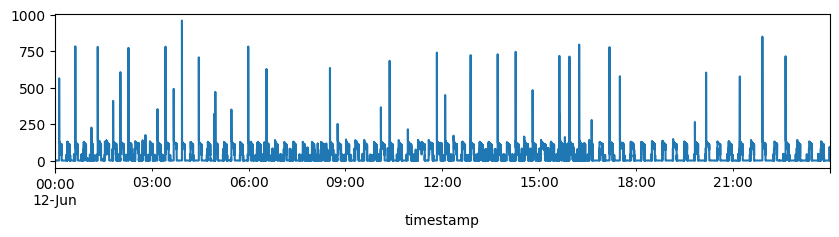

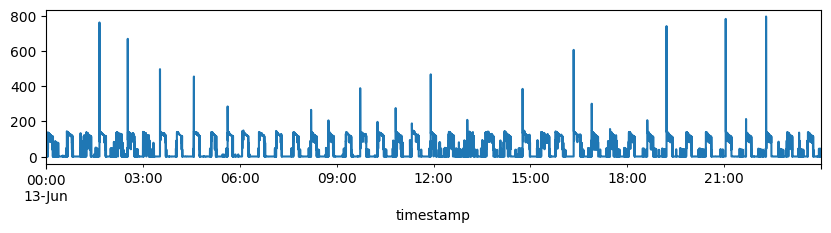

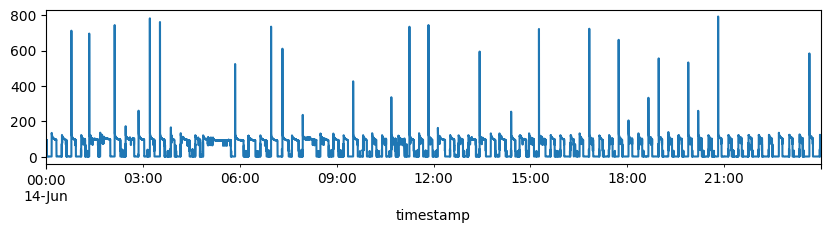

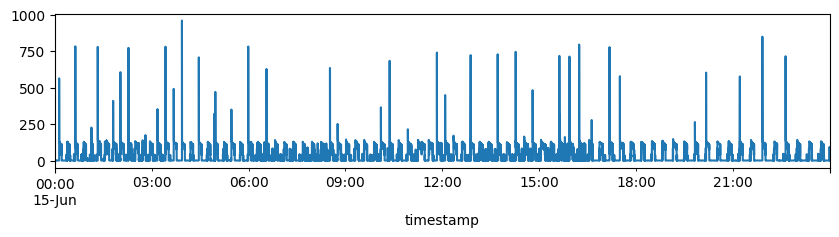

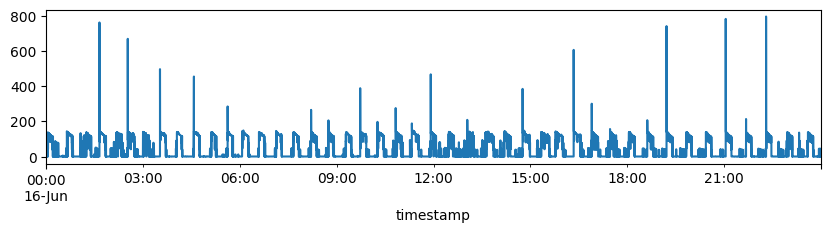

...

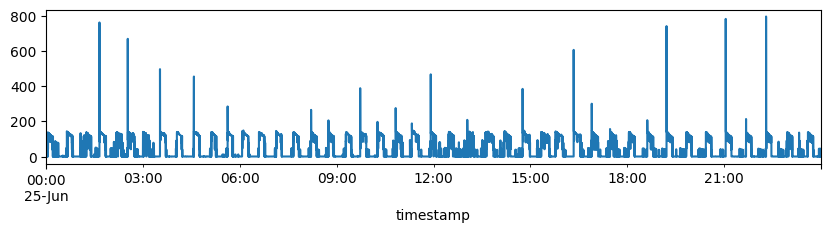

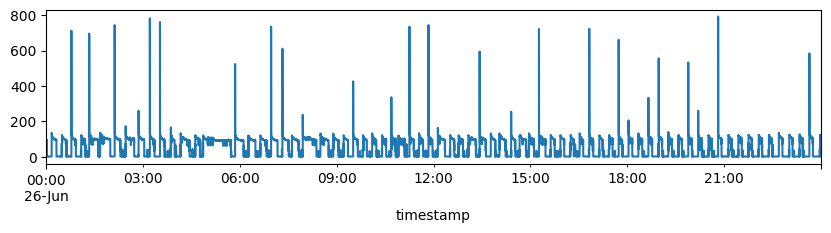

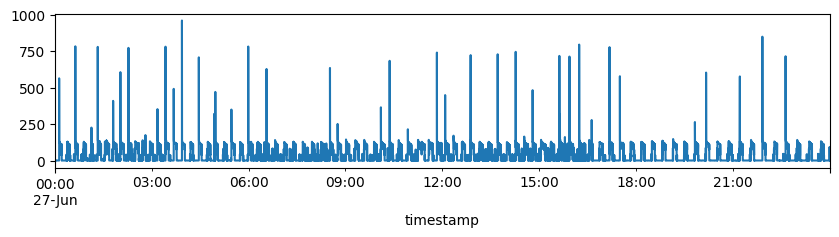

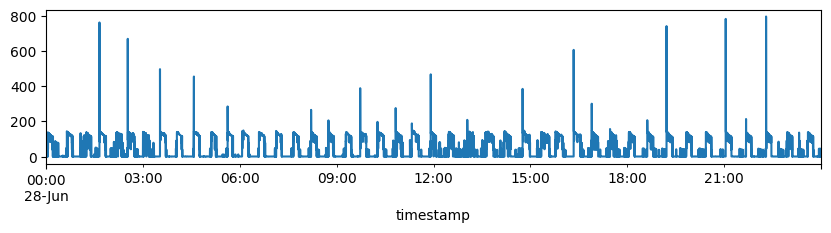

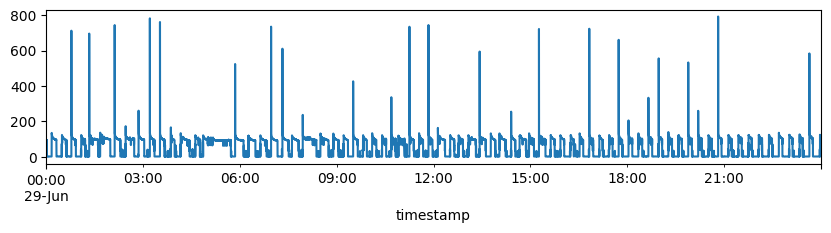

In [62]:
for i in range(12,30):
    df['f_A'].loc[f'2013-06-{i}'].plot()
    plt.show()

In [63]:
df.round(2)

,f_A,f_V,f_C
timestamp,,,
2013-06-12 00:00:00,0.11,249.99,0.01
2013-06-12 00:00:01,0.21,249.86,0.01
2013-06-12 00:00:02,0.16,249.88,0.01
2013-06-12 00:00:03,0.20,249.92,0.01
2013-06-12 00:00:04,0.03,249.91,0.01
...,...,...,...
2013-08-03 23:59:55,0.13,221.70,0.01
2013-08-03 23:59:56,0.19,221.61,0.01
2013-08-03 23:59:57,0.17,221.72,0.01


In [2]:
df.to_csv("d:/clean_data/c_f.csv")


NameError: name 'df' is not defined

In [3]:
df = pd.read_csv("d:/clean_data/c_f.csv")
df

,timestamp,f_A,f_V,f_C
0,2013-06-12 00:00:00,0.11,249.99,0.011
1,2013-06-12 00:00:01,0.21,249.86,0.011
2,2013-06-12 00:00:02,0.16,249.88,0.011
3,2013-06-12 00:00:03,0.20,249.92,0.011
4,2013-06-12 00:00:04,0.03,249.91,0.010
...,...,...,...,...
4579195,2013-08-03 23:59:55,0.13,221.70,0.011
4579196,2013-08-03 23:59:56,0.19,221.61,0.011
4579197,2013-08-03 23:59:57,0.17,221.72,0.010
4579198,2013-08-03 23:59:58,0.15,221.83,0.011


In [60]:
df.loc[f'2013-06-23']

,f_A,f_V,f_C
Timestamp,,,
2013-06-23 00:00:00,0.186667,225.206667,0.011
2013-06-23 00:00:01,0.186667,225.506667,0.011
2013-06-23 00:00:02,0.180000,219.090000,0.011
2013-06-23 00:00:03,0.180000,215.090000,0.011
2013-06-23 00:00:04,0.210000,215.000000,0.011
...,...,...,...
2013-06-23 23:59:55,0.130000,221.700000,0.011
2013-06-23 23:59:56,0.190000,221.610000,0.011
2013-06-23 23:59:57,0.170000,221.720000,0.010


In [ ]:
specific_dates = ['2013-06-15',
                   '2013-06-17',
                     '2013-06-23', 
                     '2013-06-28',
                    '2013-06-29',
                     '2013-06-30'
                     ]
specific_dates_dt = pd.to_datetime(specific_dates)
for i in specific_dates_dt:
    fd = df.loc[f"{i.date()}"].copy()
    print(i.date(),len(fd),fd['f_A'].isna().sum())
    fd['f_A'].plot()
    plt.title(i.date())
    plt.show()


In [ ]:
df1 = df.loc["2013-06-28"].copy()
print(df1['f_A'].isna().sum())
print(len(df1))
df1

In [ ]:
def create_features(hourly_data):
    hourly_data = hourly_data.copy()
    # Check if the index is in datetime format
    if not isinstance(hourly_data.index, pd.DatetimeIndex):
        hourly_data.index = pd.to_datetime(hourly_data.index)
    
    hourly_data['sec'] = hourly_data.index.second
    hourly_data['minute'] = hourly_data.index.minute
    hourly_data['hour'] = hourly_data.index.hour
    hourly_data['day'] = hourly_data.index.day
    # hourly_data['dayofweek'] = hourly_data.index.dayofweek
    # hourly_data['weekofyear'] = hourly_data.index.isocalendar().week
    # hourly_data['month'] = hourly_data.index.month
    return hourly_data
df1 = create_features(df1)
df1

In [ ]:
df1['f_A'].isna().sum()

In [ ]:
df1 = create_features(df1)
original_timestamps = df1.index
knn_imputer = KNNImputer(n_neighbors=1)
imputed_data = knn_imputer.fit_transform(df1)

imputed_df = pd.DataFrame(imputed_data, columns=df1.columns)
imputed_df['Timestamp'] = original_timestamps
imputed_df.set_index(['Timestamp'],drop=True,inplace=True)

In [ ]:
sliderPlot(df1['f_A'].loc['2013-06-28'],t="line")
sliderPlot(imputed_df['f_A'].loc['2013-06-28'],t="line")

In [ ]:
df1 = create_features(df1)
original_timestamps = df1.index
knn_imputer = KNNImputer(n_neighbors=2)
imputed_data = knn_imputer.fit_transform(df1)

imputed_df = pd.DataFrame(imputed_data, columns=df1.columns)
imputed_df['Timestamp'] = original_timestamps
imputed_df.set_index(['Timestamp'],drop=True,inplace=True)
sliderPlot(df1['f_A'].loc['2013-06-28'],t="line")
sliderPlot(imputed_df['f_A'].loc['2013-06-28'],t="line")

In [ ]:
df1 = create_features(df1)
original_timestamps = df1.index
knn_imputer = KNNImputer(n_neighbors=3)
imputed_data = knn_imputer.fit_transform(df1)

imputed_df = pd.DataFrame(imputed_data, columns=df1.columns)
imputed_df['Timestamp'] = original_timestamps
imputed_df.set_index(['Timestamp'],drop=True,inplace=True)
sliderPlot(df1['f_A'].loc['2013-06-28'],t="line")
sliderPlot(imputed_df['f_A'].loc['2013-06-28'],t="line")

In [ ]:
df1 = create_features(df1)
original_timestamps = df1.index
knn_imputer = KNNImputer(n_neighbors=4)
imputed_data = knn_imputer.fit_transform(df1)

imputed_df = pd.DataFrame(imputed_data, columns=df1.columns)
imputed_df['Timestamp'] = original_timestamps
imputed_df.set_index(['Timestamp'],drop=True,inplace=True)
sliderPlot(df1['f_A'].loc['2013-06-28'],t="line")
sliderPlot(imputed_df['f_A'].loc['2013-06-28'],t="line")

In [ ]:
df1 = create_features(df1)
original_timestamps = df1.index
knn_imputer = KNNImputer(n_neighbors=5)
imputed_data = knn_imputer.fit_transform(df1)

imputed_df = pd.DataFrame(imputed_data, columns=df1.columns)
imputed_df['Timestamp'] = original_timestamps
imputed_df.set_index(['Timestamp'],drop=True,inplace=True)
sliderPlot(df1['f_A'].loc['2013-06-28'],t="line")
sliderPlot(imputed_df['f_A'].loc['2013-06-28'],t="line")

In [ ]:
df1 = create_features(df1)
original_timestamps = df1.index
knn_imputer = KNNImputer(n_neighbors=6)
imputed_data = knn_imputer.fit_transform(df1)

imputed_df = pd.DataFrame(imputed_data, columns=df1.columns)
imputed_df['Timestamp'] = original_timestamps
imputed_df.set_index(['Timestamp'],drop=True,inplace=True)
sliderPlot(df1['f_A'].loc['2013-06-28'],t="line")
sliderPlot(imputed_df['f_A'].loc['2013-06-28'],t="line")

In [ ]:
# Convert index to DatetimeIndex if it's not already
if not isinstance(df.index, pd.DatetimeIndex):
    df.index = pd.to_datetime(df.index)
specific_dates = ['2013-06-15',
                   '2013-06-17',
                     '2013-06-23', 
                     '2013-06-28',
                    '2013-06-29',
                     '2013-06-30'
                     ]
specific_dates_dt = pd.to_datetime(specific_dates)
mask = df.index.floor('D').isin(specific_dates_dt)
df1 = df[mask]
df1

In [ ]:
print(df1['f_A'].isna().sum())
def create_features(hourly_data):
    hourly_data = hourly_data.copy()
    # Check if the index is in datetime format
    if not isinstance(hourly_data.index, pd.DatetimeIndex):
        hourly_data.index = pd.to_datetime(hourly_data.index)
    
    hourly_data['sec'] = hourly_data.index.second
    hourly_data['minute'] = hourly_data.index.minute
    hourly_data['hour'] = hourly_data.index.hour
    hourly_data['day'] = hourly_data.index.day
    # hourly_data['dayofweek'] = hourly_data.index.dayofweek
    # hourly_data['weekofyear'] = hourly_data.index.isocalendar().week
    # hourly_data['month'] = hourly_data.index.month
    return hourly_data
df1 = create_features(df1)
df1

In [ ]:
df1 = create_features(df1)
original_timestamps = df1.index
knn_imputer = KNNImputer(n_neighbors=1)
imputed_data = knn_imputer.fit_transform(df1)

imputed_df = pd.DataFrame(imputed_data, columns=df1.columns)
imputed_df['Timestamp'] = original_timestamps
imputed_df.set_index(['Timestamp'],drop=True,inplace=True)
# sliderPlot(df1['f_A'].loc['2013-06-28'],t="line")
# sliderPlot(imputed_df['f_A'].loc['2013-06-28'],t="line")

In [ ]:
sliderPlot(df1['f_A'].loc['2013-06-28'],t="line")
sliderPlot(imputed_df['f_A'].loc['2013-06-28'],t="line")

In [ ]:
df = df1.copy()
df

In [ ]:
import numpy as np
import pandas as pd
from scipy.interpolate import CubicSpline

for column in df.columns:
    # Replace missing values with NaNs in the current column
    missing_indices = df[column].index[df[column].isna()]
    non_missing_indices = df[column].index[df[column].notna()]
    # Convert timestamps to numerical values
    non_missing_indices_numeric = non_missing_indices.to_numpy()
    missing_indices_numeric = missing_indices.to_numpy()
    # Create a cubic spline interpolation function for the current column
    cs = CubicSpline(non_missing_indices_numeric, df[column].dropna().to_numpy(), bc_type='natural')
    # Interpolate missing values in the current column
    df.loc[missing_indices, column] = cs(missing_indices_numeric)
df[df.values<0]


In [ ]:
df['f_V'].plot()

In [ ]:
sliderPlot(df1['f_A'].loc['2013-06-28'],t="line")
sliderPlot(df['f_A'].loc['2013-06-28'],t="line")
# sliderPlot(imputed_df['f_A'].loc['2013-06-28'],t="line")

In [ ]:
specific_dates = ['2013-06-15',
                   '2013-06-17',
                     '2013-06-23', 
                     '2013-06-28',
                    '2013-06-29',
                     '2013-06-30'
                     ]
specific_dates_dt = pd.to_datetime(specific_dates)
i = specific_dates[0]
sliderPlot(df1['f_A'].loc[f"{i}"],t="line")
sliderPlot(df['f_A'].loc[f"{i}"],t="line")
  